In [75]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [76]:
dataset = pd.read_csv('valorant_match_clsfc.csv')
dataset.head()

,game_id,episode,act,rank,date,agent,map,outcome,round_wins,round_losses,kills,deaths,assists,kdr,avg_dmg_delta,headshot_pct,avg_dmg,acs,num_frag
0,1,6,2,Placement,04/11/2023,Cypher,Ascent,Loss,5,13,8,15,4,0.5,-61,3,76,125,3
1,2,6,2,Placement,04/12/2023,Cypher,Icebox,Loss,4,13,3,15,2,0.2,-124,22,42,59,5
2,3,6,2,Placement,4/15/2023,KAY/O,Lotus,Win,13,4,7,12,7,0.6,-46,2,87,132,5
3,4,6,2,Placement,4/15/2023,Brimstone,Ascent,Loss,9,13,18,12,10,1.5,23,14,137,230,2
4,5,6,2,Placement,4/15/2023,Cypher,Haven,Loss,1,13,6,14,3,0.4,-75,7,90,146,4


In [77]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   game_id        1000 non-null   int64  
 1   episode        1000 non-null   int64  
 2   act            1000 non-null   int64  
 3   rank           1000 non-null   object 
 4   date           1000 non-null   object 
 5   agent          1000 non-null   object 
 6   map            1000 non-null   object 
 7   outcome        1000 non-null   object 
 8   round_wins     1000 non-null   int64  
 9   round_losses   1000 non-null   int64  
 10  kills          1000 non-null   int64  
 11  deaths         1000 non-null   int64  
 12  assists        1000 non-null   int64  
 13  kdr            1000 non-null   float64
 14  avg_dmg_delta  1000 non-null   int64  
 15  headshot_pct   1000 non-null   int64  
 16  avg_dmg        1000 non-null   int64  
 17  acs            1000 non-null   int64  
 18  num_frag 

In [78]:
print("missing value :")
dataset.isnull().sum()

missing value :


game_id          0
episode          0
act              0
rank             0
date             0
agent            0
map              0
outcome          0
round_wins       0
round_losses     0
kills            0
deaths           0
assists          0
kdr              0
avg_dmg_delta    0
headshot_pct     0
avg_dmg          0
acs              0
num_frag         0
dtype: int64

In [79]:
print("duplikat data : ")
dataset.duplicated()

duplikat data : 


0      False
1      False
2      False
3      False
4      False
       ...  
995    False
996    False
997    False
998    False
999    False
Length: 1000, dtype: bool

In [80]:
def debug(message):
    print(f"DEBUG: {message}")

def unit_step_func(x):
    debug(f"Unit step input: {x}")
    return np.where(x > 0, 1, 0)

class Perceptron:
    def __init__(self, learning_rate=0.01, n_iters=50):
        debug(f"Initializing Perceptron with learning_rate={learning_rate}, n_iters={n_iters}")
        self.lr = learning_rate
        self.n_iters = n_iters
        self.activation_func = unit_step_func
        self.weights = None
        self.bias = None

    def fit(self, X, y):
        n_samples, n_features = X.shape
        debug(f"Training data shape: {n_samples} samples, {n_features} features")
        self.weights = np.zeros(n_features)
        self.bias = 0
        debug(f"Initial weights: {self.weights}, Initial bias: {self.bias}")
        
        y_ = np.where(y > 0, 1, 0)

        for epoch in range(self.n_iters):
            debug(f"Epoch {epoch + 1}/{self.n_iters}")
            for idx, x_i in enumerate(X):
                akamsi =  np.dot(x_i, self.weights)
                linear_output = akamsi + self.bias
                debug(f"Sample {idx}: Akamsi: {akamsi}: Linear output: {linear_output}")
                
                y_predicted = self.activation_func(linear_output)
                debug(f"Sample {idx}: Predicted: {y_predicted}")

                error = y_[idx] - y_predicted
                debug(f"Sample {idx}: Target: {y_[idx]}: Output: {y_predicted}: Error: {error}")
                
                update = self.lr * error
                debug(f"Sample {idx}: Update value: {update}")

                self.weights += update * x_i
                self.bias += update
                debug(f"Sample {idx}: Updated weights: {self.weights}, Updated bias: {self.bias}")

    def predict(self, X):
        debug("Predicting new data")
        linear_output = np.dot(X, self.weights) + self.bias
        debug(f"Linear output: {linear_output}")
        predictions = self.activation_func(linear_output)
        debug(f"Predictions: {predictions}")
        return predictions

# Dataset preprocessing
dataset['outcome'] = LabelEncoder().fit_transform(dataset['outcome'])
debug("Encoded target variable 'outcome'")

X = dataset[['round_wins', 'round_losses', 'kills', 'deaths', 'assists', 'kdr', 'avg_dmg', 'acs', 'headshot_pct']]
y = dataset['outcome']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
debug("Split dataset into training and testing sets")

# Train perceptron
p = Perceptron(learning_rate=0.01, n_iters=50)
p.fit(X_train.values, y_train.values)

# Evaluate perceptron
predictions = p.predict(X_test.values)
accuracy = np.sum(y_test.values == predictions) / len(y_test.values)
print("Perceptron Accuracy:", accuracy)

train_predictions = p.predict(X_train.values)
train_accuracy = np.sum(y_train.values == train_predictions) / len(y_train.values)
print("Perceptron Training Accuracy:", train_accuracy)

data_sizes = [len(X_train), len(X_test)]
labels = ['Train Data (70%)', 'Test Data (30%)']

DEBUG: Encoded target variable 'outcome'
DEBUG: Split dataset into training and testing sets
DEBUG: Initializing Perceptron with learning_rate=0.01, n_iters=50
DEBUG: Training data shape: 700 samples, 9 features
DEBUG: Initial weights: [0. 0. 0. 0. 0. 0. 0. 0. 0.], Initial bias: 0
DEBUG: Epoch 1/50
DEBUG: Sample 0: Akamsi: 0.0: Linear output: 0.0
DEBUG: Unit step input: 0.0
DEBUG: Sample 0: Predicted: 0
DEBUG: Sample 0: Target: 0: Output: 0: Error: 0
DEBUG: Sample 0: Update value: 0.0
DEBUG: Sample 0: Updated weights: [0. 0. 0. 0. 0. 0. 0. 0. 0.], Updated bias: 0.0
DEBUG: Sample 1: Akamsi: 0.0: Linear output: 0.0
DEBUG: Unit step input: 0.0
DEBUG: Sample 1: Predicted: 0
DEBUG: Sample 1: Target: 0: Output: 0: Error: 0
DEBUG: Sample 1: Update value: 0.0
DEBUG: Sample 1: Updated weights: [0. 0. 0. 0. 0. 0. 0. 0. 0.], Updated bias: 0.0
DEBUG: Sample 2: Akamsi: 0.0: Linear output: 0.0
DEBUG: Unit step input: 0.0
DEBUG: Sample 2: Predicted: 0
DEBUG: Sample 2: Target: 1: Output: 0: Error: 1
D

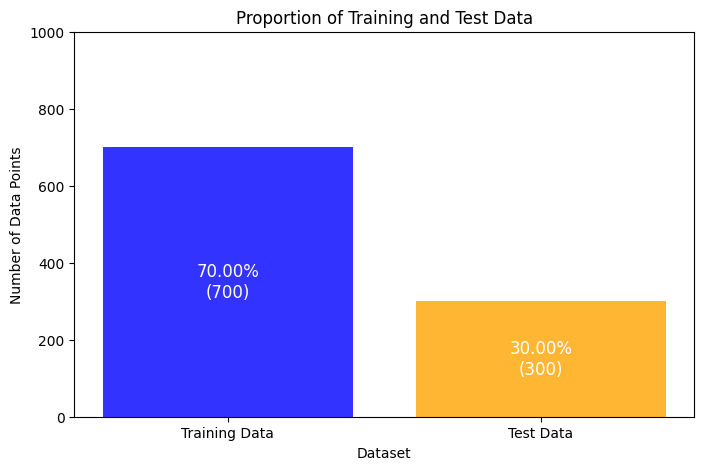

In [81]:
data_sizes = [len(X_train), len(X_test)]
total_data = sum(data_sizes)
percentages = [size / total_data * 100 for size in data_sizes]
labels = ['Training Data', 'Test Data']

plt.figure(figsize=(8, 5))
bars = plt.bar(labels, data_sizes, color=['blue', 'orange'], alpha=0.8)
plt.title('Proportion of Training and Test Data')
plt.ylabel('Number of Data Points')
plt.xlabel('Dataset')
plt.ylim(0, 1000)

for bar, percentage, size in zip(bars, percentages, data_sizes):
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() / 2,
        f"{percentage:.2f}%\n({size})",
        ha='center', va='center', fontsize=12, color='white'
    )

plt.show()

C:\Users\ASUS\AppData\Local\Temp\ipykernel_19136\796743748.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=y_train, ax=ax[0], palette="pastel")
C:\Users\ASUS\AppData\Local\Temp\ipykernel_19136\796743748.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x=y_test, ax=ax[1], palette="pastel")


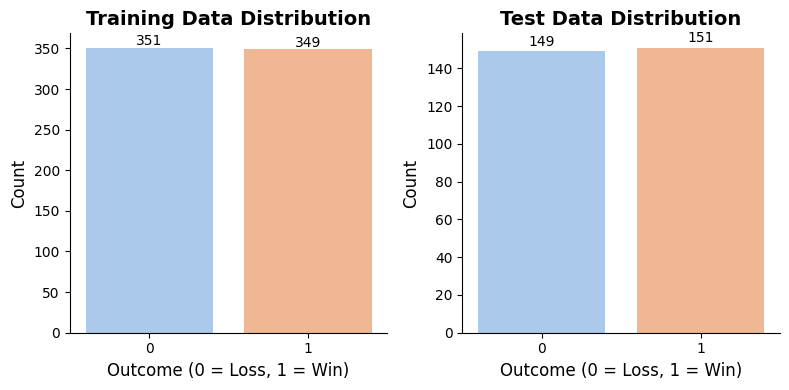

In [82]:
def plot_data_distribution(y_train, y_test):
  fig, ax = plt.subplots(1, 2, figsize=(8, 4))

  sns.countplot(x=y_train, ax=ax[0], palette="pastel")
  ax[0].set_title("Training Data Distribution", fontsize=14, fontweight='bold')
  ax[0].set_xlabel("Outcome (0 = Loss, 1 = Win)", fontsize=12)
  ax[0].set_ylabel("Count", fontsize=12)

  for p in ax[0].patches:
    height = p.get_height()
    ax[0].text(p.get_x() + p.get_width() / 2., height + 3,
               f'{int(height)}', ha="center", fontsize=10, color="black")

  sns.countplot(x=y_test, ax=ax[1], palette="pastel")
  ax[1].set_title("Test Data Distribution", fontsize=14, fontweight='bold')
  ax[1].set_xlabel("Outcome (0 = Loss, 1 = Win)", fontsize=12)
  ax[1].set_ylabel("Count", fontsize=12)

  for p in ax[1].patches:
    height = p.get_height()
    ax[1].text(p.get_x() + p.get_width() / 2., height + 3,
               f'{int(height)}', ha="center", fontsize=10, color="black")

  sns.despine()
  plt.tight_layout()
  plt.show()

plot_data_distribution(y_train, y_test)